# Restaurant Scores Feature Engineering
https://data.sfgov.org/Health-and-Social-Services/Restaurant-Scores-LIVES-Standard/pyih-qa8i?row_index=0

This dataset describes health inspection results for restaurants in San Fransisco

In [1]:
import requests
import pandas as pd
import plotly.express as px
import plotly.graph_objs as go
import os
import numpy as np
import nltk
from nltk.stem import WordNetLemmatizer

# Raw Data Read

In [2]:
# Reading
raw_df = pd.read_csv('https://data.sfgov.org/api/views/pyih-qa8i/rows.csv?accessType=DOWNLOAD')

In [3]:
pd.options.display.max_columns = 500
raw_df

,business_id,business_name,business_address,business_city,business_state,business_postal_code,business_latitude,business_longitude,business_location,business_phone_number,inspection_id,inspection_date,inspection_score,inspection_type,violation_id,violation_description,risk_category,Neighborhoods,SF Find Neighborhoods,Current Police Districts,Current Supervisor Districts,Analysis Neighborhoods
0,85936,Laurel Court,950 Mason St,San Francisco,CA,94108,NaN,NaN,NaN,1.415578e+10,85936_20170925,09/25/2017 12:00:00 AM,100.0,Routine - Unscheduled,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,5827,HILLCREST ELEMENTARY SCHOOL,810 SILVER Ave,San Francisco,CA,94134,37.729016,-122.419253,POINT (-122.419253 37.729016),1.415546e+10,5827_20170224,02/24/2017 12:00:00 AM,NaN,Reinspection/Followup,NaN,NaN,NaN,92.0,92.0,2.0,2.0,7.0
2,94910,Ike's Kitchen,800 Van Ness Ave,San Francisco,CA,94109,NaN,NaN,NaN,NaN,94910_20180530,05/30/2018 12:00:00 AM,NaN,New Ownership - Followup,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,64667,Jasmine Rae Bakery,1890 Bryant St #309,San Francisco,CA,94110,37.763156,-122.410351,POINT (-122.410351 37.763156),NaN,64667_20170814,08/14/2017 12:00:00 AM,NaN,Reinspection/Followup,NaN,NaN,NaN,53.0,53.0,3.0,2.0,20.0
4,97722,THE CHURRO FACTORY,PIER 39 K-01,San Francisco,CA,94133,NaN,NaN,NaN,NaN,97722_20181217,12/17/2018 12:00:00 AM,96.0,Routine - Unscheduled,97722_20181217_103154,Unclean or degraded floors walls or ceilings,Low Risk,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
53968,70220,Trader Joe's #200,1095 Hyde St,San Francisco,CA,94109,NaN,NaN,NaN,1.415530e+10,70220_20170913,09/13/2017 12:00:00 AM,NaN,Complaint,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
53969,95021,Wing Wings,422 Haight St,San Francisco,CA,94117,NaN,NaN,NaN,1.415584e+10,95021_20190228,02/28/2019 12:00:00 AM,92.0,Routine - Unscheduled,95021_20190228_103119,Inadequate and inaccessible handwashing facili...,Moderate Risk,NaN,NaN,NaN,NaN,NaN
53970,78289,Sam Jordans Bar,4004 03rd St,San Francisco,CA,94124,NaN,NaN,NaN,NaN,78289_20161209,12/09/2016 12:00:00 AM,NaN,Reinspection/Followup,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
53971,100887,ASIA CHINESE FOOD,350 BAY ST.,San Francisco,CA,94133,NaN,NaN,NaN,1.415582e+10,100887_20190814,08/14/2019 12:00:00 AM,NaN,New Ownership - Followup,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [4]:
raw_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 53973 entries, 0 to 53972
Data columns (total 22 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   business_id                   53973 non-null  int64  
 1   business_name                 53973 non-null  object 
 2   business_address              53973 non-null  object 
 3   business_city                 53973 non-null  object 
 4   business_state                53973 non-null  object 
 5   business_postal_code          52787 non-null  object 
 6   business_latitude             27475 non-null  float64
 7   business_longitude            27475 non-null  float64
 8   business_location             27460 non-null  object 
 9   business_phone_number         17672 non-null  float64
 10  inspection_id                 53973 non-null  object 
 11  inspection_date               53973 non-null  object 
 12  inspection_score              39541 non-null  float64
 13  i

In [5]:
raw_df.isnull().sum() / len(raw_df)

business_id                     0.000000
business_name                   0.000000
business_address                0.000000
business_city                   0.000000
business_state                  0.000000
business_postal_code            0.021974
business_latitude               0.490949
business_longitude              0.490949
business_location               0.491227
business_phone_number           0.672577
inspection_id                   0.000000
inspection_date                 0.000000
inspection_score                0.267393
inspection_type                 0.000000
violation_id                    0.254201
violation_description           0.254201
risk_category                   0.254201
Neighborhoods                   0.491690
SF Find Neighborhoods           0.491690
Current Police Districts        0.491468
Current Supervisor Districts    0.491468
Analysis Neighborhoods          0.491468
dtype: float64

# Enriched Data Read (from prep notebook)

In [6]:
enriched_df = pd.read_parquet('./data/enriched_data.parquet')
enriched_df

,business_id,business_name,business_address,business_city,business_state,business_postal_code,business_latitude,business_longitude,business_location,business_phone_number,inspection_id,inspection_date,inspection_score,inspection_type,violation_id,violation_description,risk_category,Neighborhoods,SF Find Neighborhoods,Current Police Districts,Current Supervisor Districts,Analysis Neighborhoods
0,835,Kam Po Kitchen,801 Broadway St,San Francisco,CA,94133,37.797223,-122.410513,POINT (-122.410513 37.797223),NaN,835_20180917,09/17/2018 12:00:00 AM,88.0,Routine - Unscheduled,835_20180917_103139,Improper food storage,Low Risk,107.0,107.0,6.0,3.0,6.0
1,905,Working Girls' Cafe',0259 Kearny St,San Francisco,CA,94108,37.790477,-122.404033,POINT (-122.404033 37.790477),NaN,905_20190415,04/15/2019 12:00:00 AM,87.0,Routine - Unscheduled,905_20190415_103114,High risk vermin infestation,High Risk,19.0,19.0,6.0,3.0,8.0
2,1203,TAWAN'S THAI FOOD,4403 GEARY Blvd,San Francisco,CA,94118,37.780834,-122.466590,POINT (-122.46659 37.780834),1.415576e+10,1203_20170803,08/03/2017 12:00:00 AM,77.0,Routine - Unscheduled,1203_20170803_103120,Moderate risk food holding temperature,Moderate Risk,5.0,5.0,8.0,4.0,11.0
3,1345,Cordon Bleu,1574 California St,San Francisco,CA,94109,37.790683,-122.420264,POINT (-122.420264 37.790683),NaN,1345_20170928,09/28/2017 12:00:00 AM,81.0,Routine - Unscheduled,1345_20170928_103105,Improper cooling methods,High Risk,105.0,105.0,4.0,3.0,21.0
4,1352,LA TORTILLA,495 Castro St B,San Francisco,CA,94114,37.760954,-122.434935,POINT (-122.434935 37.760954),1.415586e+10,1352_20180620,06/20/2018 12:00:00 AM,74.0,Routine - Unscheduled,1352_20180620_103177,Non service animal,Low Risk,38.0,38.0,3.0,5.0,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
53968,96202,Soma Eats 2,121 Spear St,San Francisco,CA,94105,37.791865,-122.392910,None,NaN,96202_20190408,04/08/2019 12:00:00 AM,85.0,Routine - Unscheduled,96202_20190408_103124,Inadequately cleaned or sanitized food contact...,Moderate Risk,NaN,NaN,NaN,NaN,NaN
53969,65396,Carmelina's Cafe,1855 Folsom St,San Francisco,CA,94103,37.767664,-122.415456,POINT (-122.415456 37.767664),NaN,65396_20170127,01/27/2017 12:00:00 AM,NaN,Reinspection/Followup,None,None,None,53.0,53.0,3.0,2.0,20.0
53970,64835,Jane,2123 Fillmore St,San Francisco,CA,94115,37.789404,-122.433954,POINT (-122.433954 37.789404),NaN,64835_20161205,12/05/2016 12:00:00 AM,NaN,Reinspection/Followup,None,None,None,102.0,102.0,4.0,6.0,30.0
53971,1000,HEUNG YUEN RESTAURANT,3279 22nd St,San Francisco,CA,94110,37.755282,-122.420493,POINT (-122.420493 37.755282),NaN,1000_20180608,06/08/2018 12:00:00 AM,NaN,Reinspection/Followup,None,None,None,53.0,53.0,3.0,2.0,20.0


In [7]:
enriched_df.isnull().sum() / len(enriched_df)

business_id                     0.000000
business_name                   0.000000
business_address                0.000000
business_city                   0.000000
business_state                  0.000000
business_postal_code            0.021974
business_latitude               0.006374
business_longitude              0.006374
business_location               0.491227
business_phone_number           0.672577
inspection_id                   0.000000
inspection_date                 0.000000
inspection_score                0.267393
inspection_type                 0.000000
violation_id                    0.254201
violation_description           0.254201
risk_category                   0.254201
Neighborhoods                   0.491690
SF Find Neighborhoods           0.491690
Current Police Districts        0.491468
Current Supervisor Districts    0.491468
Analysis Neighborhoods          0.491468
dtype: float64

In [8]:
enriched_df.describe()

,business_id,business_latitude,business_longitude,business_phone_number,inspection_score,Neighborhoods,SF Find Neighborhoods,Current Police Districts,Current Supervisor Districts,Analysis Neighborhoods
count,53973.000000,53629.000000,53629.000000,1.767200e+04,39541.000000,27435.000000,27435.000000,27447.000000,27447.000000,27447.000000
mean,55218.877883,37.762156,-121.839395,1.415541e+10,86.221669,56.963149,56.963149,5.359165,5.632055,19.459868
std,36165.556449,1.855494,8.863861,1.356438e+06,8.489218,34.804693,34.804693,2.687570,3.298057,11.615126
min,19.000000,-45.863915,-122.510896,1.415020e+10,45.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,7558.000000,37.759247,-122.436410,1.415537e+10,81.000000,28.000000,28.000000,3.000000,3.000000,8.000000
50%,69186.000000,37.779194,-122.418631,1.415561e+10,87.000000,53.000000,53.000000,6.000000,5.000000,20.000000
75%,86385.000000,37.788525,-122.406090,1.415580e+10,92.000000,95.000000,95.000000,8.000000,9.000000,30.000000
max,102705.000000,55.853783,170.489872,1.415988e+10,100.000000,117.000000,117.000000,10.000000,11.000000,41.000000


# Plotting scores per business

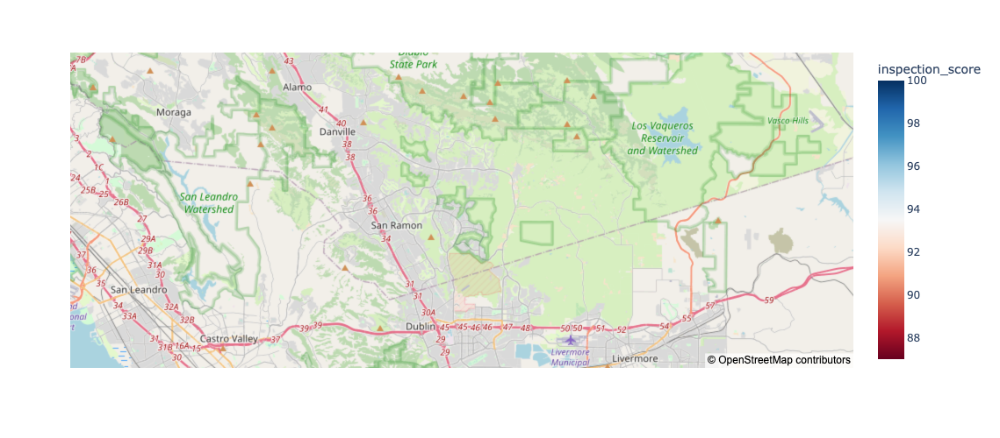

In [9]:
plot_df = enriched_df[
    (pd.notnull(enriched_df['inspection_score']))
    & (enriched_df['business_city'] == 'San Francisco')].copy()
fig = px.scatter_mapbox(plot_df, lat='business_latitude', lon='business_longitude', 
                        height=500, zoom=10, color='inspection_score', color_continuous_scale='rdbu', hover_data=['business_name', 'violation_description'],
                       range_color=[plot_df['inspection_score'].median(), plot_df['inspection_score'].max()])
fig.update_layout(mapbox_style='open-street-map')
fig.show()

## Rounded lat/lng Plot
Make sure to zoom in on the interactive map to see the more "square" neighborhoods

In [10]:
# Rounded lat/lng
plot_df['business_latitude_rounded'] = plot_df['business_latitude'].round(3)
plot_df['business_longitude_rounded'] = plot_df['business_longitude'].round(3)
plot_df.head()

,business_id,business_name,business_address,business_city,business_state,business_postal_code,business_latitude,business_longitude,business_location,business_phone_number,inspection_id,inspection_date,inspection_score,inspection_type,violation_id,violation_description,risk_category,Neighborhoods,SF Find Neighborhoods,Current Police Districts,Current Supervisor Districts,Analysis Neighborhoods,business_latitude_rounded,business_longitude_rounded
0,835,Kam Po Kitchen,801 Broadway St,San Francisco,CA,94133,37.797223,-122.410513,POINT (-122.410513 37.797223),NaN,835_20180917,09/17/2018 12:00:00 AM,88.0,Routine - Unscheduled,835_20180917_103139,Improper food storage,Low Risk,107.0,107.0,6.0,3.0,6.0,37.797,-122.411
1,905,Working Girls' Cafe',0259 Kearny St,San Francisco,CA,94108,37.790477,-122.404033,POINT (-122.404033 37.790477),NaN,905_20190415,04/15/2019 12:00:00 AM,87.0,Routine - Unscheduled,905_20190415_103114,High risk vermin infestation,High Risk,19.0,19.0,6.0,3.0,8.0,37.790,-122.404
2,1203,TAWAN'S THAI FOOD,4403 GEARY Blvd,San Francisco,CA,94118,37.780834,-122.466590,POINT (-122.46659 37.780834),1.415576e+10,1203_20170803,08/03/2017 12:00:00 AM,77.0,Routine - Unscheduled,1203_20170803_103120,Moderate risk food holding temperature,Moderate Risk,5.0,5.0,8.0,4.0,11.0,37.781,-122.467
3,1345,Cordon Bleu,1574 California St,San Francisco,CA,94109,37.790683,-122.420264,POINT (-122.420264 37.790683),NaN,1345_20170928,09/28/2017 12:00:00 AM,81.0,Routine - Unscheduled,1345_20170928_103105,Improper cooling methods,High Risk,105.0,105.0,4.0,3.0,21.0,37.791,-122.420
4,1352,LA TORTILLA,495 Castro St B,San Francisco,CA,94114,37.760954,-122.434935,POINT (-122.434935 37.760954),1.415586e+10,1352_20180620,06/20/2018 12:00:00 AM,74.0,Routine - Unscheduled,1352_20180620_103177,Non service animal,Low Risk,38.0,38.0,3.0,5.0,5.0,37.761,-122.435


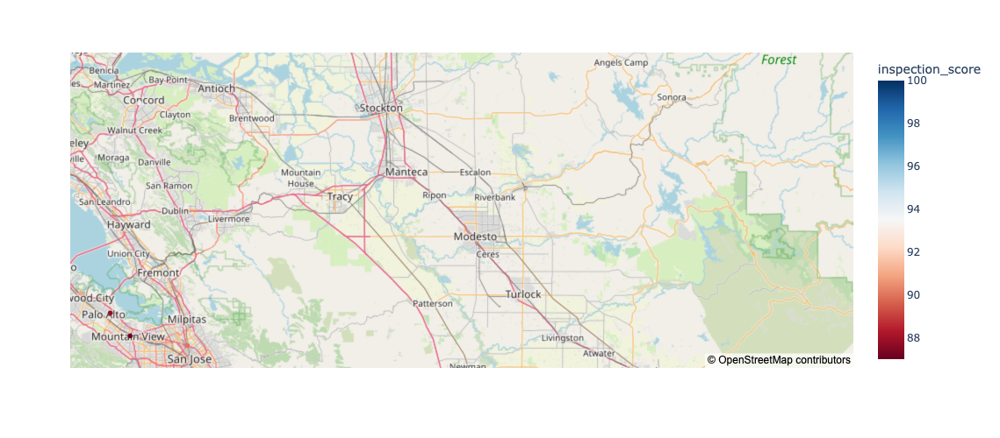

In [11]:
fig_rounded = px.scatter_mapbox(plot_df.groupby(['business_latitude_rounded', 'business_longitude_rounded']).agg(inspection_score=('inspection_score','mean')).reset_index(), 
                                lat='business_latitude_rounded', lon='business_longitude_rounded', 
                        height=500, zoom=8, color='inspection_score', color_continuous_scale='rdbu',
                       range_color=[plot_df['inspection_score'].median(), plot_df['inspection_score'].max()])
fig_rounded.update_layout(mapbox_style='open-street-map')
fig_rounded.show()

# Are there any meaningful categorical differences?

In [12]:
categorical_cols = ['business_name', 'business_postal_code', 'inspection_type', 'business_latitude_rounded']
for col in categorical_cols:
    grouped = plot_df.groupby(col).agg(median_inspection_score=('inspection_score', 'median'))
    print(col)
    display(grouped.sort_values(by='median_inspection_score'))

business_name


,median_inspection_score
business_name,
Lollipot,45.0
SUNFLOWER RESTAURANT,46.0
CHINA FIRST INC.,48.0
La Jefa,51.0
Chaat Corner,54.0
...,...
Namaskar Foods Authentic Nepalese and Indian Cusine,100.0
Native Baking Company,100.0
"Noodle Girl, LLC",100.0


business_postal_code


,median_inspection_score
business_postal_code,
CA,78.0
94134,83.0
92672,84.0
94101,84.0
94121,85.0
64110,85.0
94118,85.0
94112,86.0
94108,86.0


inspection_type


,median_inspection_score
inspection_type,
Routine - Unscheduled,87.0


business_latitude_rounded


,median_inspection_score
business_latitude_rounded,
37.392,78.0
45.964,80.0
37.810,81.0
37.737,81.0
37.712,82.0
...,...
37.819,99.0
42.651,100.0
53.379,100.0


# Time Features

In [13]:
# Time features
plot_df['inspection_day'] = pd.to_datetime(plot_df['inspection_date']).dt.date
plot_df['inspection_dayofweek'] = pd.to_datetime(plot_df['inspection_day']).dt.dayofweek
plot_df['inspection_dom'] = pd.to_datetime(plot_df['inspection_day']).dt.day
plot_df['inspection_doy'] = pd.to_datetime(plot_df['inspection_day']).dt.dayofyear
plot_df[['inspection_date', 'inspection_day', 'inspection_dayofweek', 'inspection_dom', 'inspection_doy']].head()

,inspection_date,inspection_day,inspection_dayofweek,inspection_dom,inspection_doy
0,09/17/2018 12:00:00 AM,2018-09-17,0,17,260
1,04/15/2019 12:00:00 AM,2019-04-15,0,15,105
2,08/03/2017 12:00:00 AM,2017-08-03,3,3,215
3,09/28/2017 12:00:00 AM,2017-09-28,3,28,271
4,06/20/2018 12:00:00 AM,2018-06-20,2,20,171


In [14]:
time_cols = ['inspection_dayofweek', 'inspection_dom', 'inspection_doy']
for col in time_cols:
    print(col)
    display(plot_df.groupby(col).agg(median_inspection_score=('inspection_score', 'median'),
                                               rows=('inspection_score', 'count')).sort_values(by='median_inspection_score'))

inspection_dayofweek


,median_inspection_score,rows
inspection_dayofweek,,
0,86.0,7533
1,87.0,9252
2,87.0,9472
3,88.0,7662
4,90.0,5422
5,92.0,173
6,100.0,27


inspection_dom


,median_inspection_score,rows
inspection_dom,,
16,86.5,1194
29,87.0,1000
28,87.0,1346
27,87.0,1334
24,87.0,1267
23,87.0,1210
22,87.0,1293
21,87.0,1039
18,87.0,1204


inspection_doy


,median_inspection_score,rows
inspection_doy,,
153,75.0,27
34,77.0,38
180,79.0,74
201,79.0,48
97,80.0,33
...,...,...
76,96.0,20
223,96.0,2
102,96.0,222


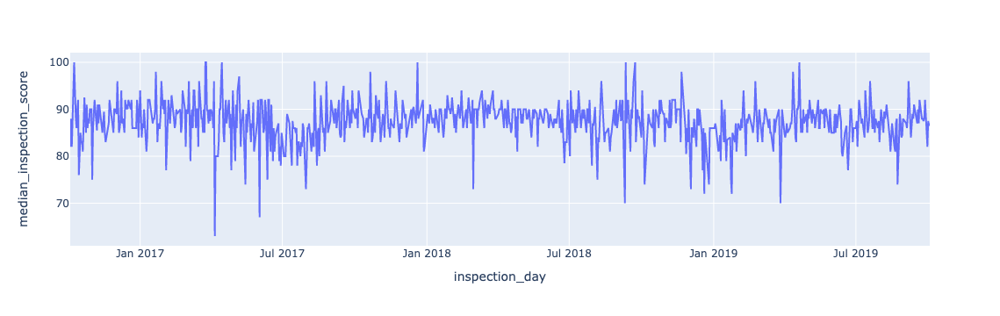

In [15]:
grouped = plot_df.groupby('inspection_day').agg(median_inspection_score=('inspection_score', 'median')).reset_index().sort_values(by='inspection_day')
line = px.line(grouped, x='inspection_day', y='median_inspection_score')
line.show()

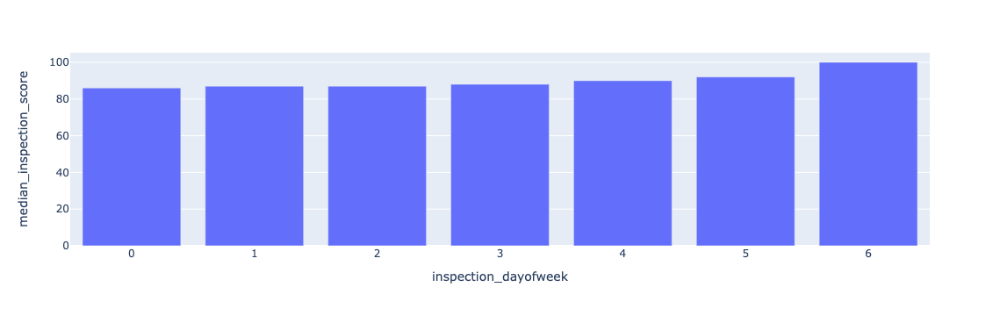

In [16]:
grouped = plot_df.groupby('inspection_dayofweek').agg(median_inspection_score=('inspection_score', 'median'),
                                                     rows=('inspection_score', 'count')).reset_index().sort_values(by='inspection_dayofweek')
bar = px.bar(grouped, x='inspection_dayofweek', y='median_inspection_score', hover_data=['rows'])
bar.show()

# Do businesses show up several times?

In [17]:
plot_df['business_name'].value_counts()

Peet's Coffee & Tea      122
Jamba Juice               68
McDonald's                64
Starbucks Coffee          56
Lee's Deli                56
                        ... 
Mixiote                    1
Drip! Mobile Espresso      1
Tinker Kitchen             1
BELCAMPO MEAT CO           1
SMITH & LORING, INC.       1
Name: business_name, Length: 5277, dtype: int64

# Target encodings
Notice we are careful to not include the current row or rows after the current row

Cannot do easy groupby transform due to inspections happening for a business multiple times a day

We are calculating weighted averages prior

In [18]:
def cumulative_weighted_average_by_group(dataframe, group_key, time_key, calc_key):
    new_col = f'{group_key}_prior_{calc_key}'
    grouped = dataframe.groupby([time_key, group_key]).agg(
        the_count=(calc_key, 'count'),
        avg_value=(calc_key, 'mean')
    ).reset_index()
    grouped['count_times_calc'] = grouped['the_count'] * grouped['avg_value']
    grouped['prior_count'] = grouped.groupby(group_key)['the_count'].cumsum()
    grouped['prior_count'] = grouped.sort_values(by=time_key).groupby(group_key)['prior_count'].transform('shift').fillna(0)
    grouped['prior_count_times_calc'] = grouped.groupby(group_key)['count_times_calc'].cumsum()
    grouped['prior_count_times_calc'] = grouped.sort_values(by=time_key).groupby(group_key)['prior_count_times_calc'].transform('shift').fillna(0)
    grouped[new_col] = grouped['prior_count_times_calc'] / grouped['prior_count']
    dataframe = pd.merge(dataframe, 
                         grouped[[time_key, group_key, new_col]], on=[time_key, group_key], suffixes=('', '_dup'), how='left')
    return dataframe

In [19]:
plot_df_with_encodings = cumulative_weighted_average_by_group(plot_df, 'business_name', 'inspection_day', 'inspection_score')
plot_df_with_encodings = cumulative_weighted_average_by_group(plot_df_with_encodings, 'business_address', 'inspection_day', 'inspection_score')
plot_df_with_encodings[plot_df_with_encodings['business_name'] == 'Pizzeria Delfina'].sort_values(by='inspection_day')[['business_address', 'business_name', 'inspection_day', 'inspection_score', 'business_name_prior_inspection_score', 'business_address_prior_inspection_score']]

,business_address,business_name,inspection_day,inspection_score,business_name_prior_inspection_score,business_address_prior_inspection_score
9183,3611 18th St,Pizzeria Delfina,2017-10-18,94.0,NaN,NaN
14938,3611 18th St,Pizzeria Delfina,2017-10-18,94.0,NaN,NaN
37283,2406 CALIFORNIA St,Pizzeria Delfina,2017-12-07,100.0,94.000000,NaN
4321,3611 18th St,Pizzeria Delfina,2018-05-10,92.0,96.000000,94.000000
4512,3611 18th St,Pizzeria Delfina,2018-05-10,92.0,96.000000,94.000000
4333,2406 CALIFORNIA St,Pizzeria Delfina,2018-09-07,89.0,94.400000,100.000000
17184,2406 CALIFORNIA St,Pizzeria Delfina,2018-09-07,89.0,94.400000,100.000000
1314,3611 18th St,Pizzeria Delfina,2019-08-15,94.0,92.857143,93.000000
3154,3611 18th St,Pizzeria Delfina,2019-08-15,94.0,92.857143,93.000000
6852,2406 CALIFORNIA St,Pizzeria Delfina,2019-10-03,90.0,93.111111,92.666667


# Word features
Lemmatization is usually a cheap strategy if you have longer descriptions and sentences, for this let's just build intuitive features based on names

In [20]:
# Preparing words for explosion
plot_df_with_encodings['cleaned_business_name'] = plot_df_with_encodings['business_name'].str.lower().str.replace("'", "").str.replace('&', '')
plot_df_with_encodings['business_name_words'] = plot_df_with_encodings['cleaned_business_name'].str.split()
plot_df_with_encodings[['business_name', 'cleaned_business_name', 'business_name_words']]
# business_names = list(plot_df_with_encodings['cleaned_business_name'].unique())

,business_name,cleaned_business_name,business_name_words
0,Kam Po Kitchen,kam po kitchen,"[kam, po, kitchen]"
1,Working Girls' Cafe',working girls cafe,"[working, girls, cafe]"
2,TAWAN'S THAI FOOD,tawans thai food,"[tawans, thai, food]"
3,Cordon Bleu,cordon bleu,"[cordon, bleu]"
4,LA TORTILLA,la tortilla,"[la, tortilla]"
...,...,...,...
39536,THE CLIFT ROYAL SONESTA HOTEL,the clift royal sonesta hotel,"[the, clift, royal, sonesta, hotel]"
39537,BlueStar Refreshment Services @ Uber Technolog...,bluestar refreshment services @ uber technolog...,"[bluestar, refreshment, services, @, uber, tec..."
39538,Moscone South Main Kitchen,moscone south main kitchen,"[moscone, south, main, kitchen]"
39539,LAWTON ELEMENTARY SCHOOL,lawton elementary school,"[lawton, elementary, school]"


In [21]:
# Exploding and then showing top 50 words to grab features from
exploded = plot_df_with_encodings[['business_name_words']].explode('business_name_words')
display(exploded)
word_counts = exploded['business_name_words'].value_counts().reset_index()
display(word_counts)
top_50 = word_counts.head(50)['index'].to_list()
print(top_50)

,business_name_words
0,kam
0,po
0,kitchen
1,working
1,girls
...,...
39539,elementary
39539,school
39540,soma
39540,eats


,index,business_name_words
0,restaurant,4114
1,cafe,3158
2,market,1803
3,the,1767
4,coffee,1221
...,...,...
5242,trilogisf,1
5243,society,1
5244,champagne,1
5245,herbst,1


['restaurant', 'cafe', 'market', 'the', 'coffee', 'bakery', 'house', 'bar', 'pizza', 'inc.', 'kitchen', 'school', 'llc', 'and', 'sushi', 'la', 'thai', 'grill', 'inc', 'deli', 'taqueria', 'el', 'san', 'new', '-', 'of', 'tea', 'francisco', 'sf', 'golden', 'elementary', 'seafood', 'food', 'cuisine', 'club', 'shop', 'street', 'express', 'starbucks', 'subway', 'king', 'center', 'mission', '#2', 'city', 'garden', 'de', 'little', 'catering', 'bistro']


In [22]:
# Buildilng features from that
features_that_we_care_about = ['restaurant', 'cafe', 'market', 'coffee', 'bakery', 'house', 'bar', 'pizza', 'kitchen', 'school', 'sushi', 'thai',
                              'grill', 'deli', 'taqueria', 'tea', 'seafood', 'cuisine', 'club', 'shop,' 'express', 'king', 'catering', 'bistro']
filtered_exploded = exploded[exploded['business_name_words'].isin(features_that_we_care_about)]
filtered_exploded['has'] = 1
filtered_exploded = filtered_exploded.reset_index()
pivoted_words = pd.pivot_table(filtered_exploded, index='index', values=['has'], columns='business_name_words').fillna(0)
pivoted_words.columns = [f'{x[0]}_{x[1]}' for x in pivoted_words.columns]
pivoted_words = pivoted_words.reset_index()
pivoted_words

/tmp/ipykernel_192/2748504280.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,index,has_bakery,has_bar,has_bistro,has_cafe,has_catering,has_club,has_coffee,has_cuisine,has_deli,has_grill,has_house,has_king,has_kitchen,has_market,has_pizza,has_restaurant,has_school,has_seafood,has_sushi,has_taqueria,has_tea,has_thai
0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,8,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,9,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18870,39530,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
18871,39531,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
18872,39534,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
18873,39538,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [23]:
# Bringing it back to our original
word_cols = [c for c in pivoted_words.columns if c != 'index']
features_built_dataframe = pd.merge(plot_df_with_encodings.reset_index(), pivoted_words, on='index', how='left')
features_built_dataframe[word_cols] = features_built_dataframe[word_cols].fillna(0)
features_built_dataframe[['business_name'] + word_cols]

,business_name,has_bakery,has_bar,has_bistro,has_cafe,has_catering,has_club,has_coffee,has_cuisine,has_deli,has_grill,has_house,has_king,has_kitchen,has_market,has_pizza,has_restaurant,has_school,has_seafood,has_sushi,has_taqueria,has_tea,has_thai
0,Kam Po Kitchen,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,Working Girls' Cafe',0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,TAWAN'S THAI FOOD,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,Cordon Bleu,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,LA TORTILLA,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39536,THE CLIFT ROYAL SONESTA HOTEL,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
39537,BlueStar Refreshment Services @ Uber Technolog...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
39538,Moscone South Main Kitchen,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
39539,LAWTON ELEMENTARY SCHOOL,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0


In [24]:
# Aaaaand target encode them
features_built_dataframe_target_encoding = features_built_dataframe
for col in word_cols:
    features_built_dataframe_target_encoding = cumulative_weighted_average_by_group(features_built_dataframe_target_encoding, 
                                                                                    col, 'inspection_day', 'inspection_score')
features_built_dataframe_target_encoding[[c for c in features_built_dataframe_target_encoding if 'prior_inspection_score' in c]]

,business_name_prior_inspection_score,business_address_prior_inspection_score,has_bakery_prior_inspection_score,has_bar_prior_inspection_score,has_bistro_prior_inspection_score,has_cafe_prior_inspection_score,has_catering_prior_inspection_score,has_club_prior_inspection_score,has_coffee_prior_inspection_score,has_cuisine_prior_inspection_score,has_deli_prior_inspection_score,has_grill_prior_inspection_score,has_house_prior_inspection_score,has_king_prior_inspection_score,has_kitchen_prior_inspection_score,has_market_prior_inspection_score,has_pizza_prior_inspection_score,has_restaurant_prior_inspection_score,has_school_prior_inspection_score,has_seafood_prior_inspection_score,has_sushi_prior_inspection_score,has_taqueria_prior_inspection_score,has_tea_prior_inspection_score,has_thai_prior_inspection_score
0,86.0,86.000000,86.486421,86.409019,86.406768,86.464857,86.386851,86.380113,86.239356,86.423333,86.401059,86.408142,86.445904,86.404686,84.709486,86.465131,86.390004,87.016608,86.210229,86.438591,86.390622,86.461040,86.347579,86.470897
1,96.0,96.000000,86.238333,86.166901,86.169500,85.273309,86.151298,86.139725,86.014114,86.181088,86.174587,86.165355,86.208088,86.174829,86.187633,86.227455,86.149258,86.811213,85.937737,86.210348,86.153077,86.227004,86.108147,86.231032
2,98.0,98.000000,85.847082,85.792441,85.791278,85.859875,85.759636,85.736085,85.605899,85.827744,85.803369,85.768972,85.830411,85.802957,85.869565,85.871184,85.726633,86.476787,85.581759,85.834694,85.778291,85.826195,85.725830,79.112583
3,NaN,NaN,85.828193,85.749143,85.757471,85.832570,85.727141,85.706796,85.568051,85.787902,85.762282,85.742740,85.800982,85.763211,85.830733,85.861859,85.699823,86.423365,85.519728,85.811147,85.744966,85.788281,85.691956,85.857451
4,86.0,86.000000,86.500821,86.426678,86.421604,86.476212,86.399481,86.390546,86.256553,86.433348,86.414463,86.423995,86.451169,86.415758,86.454519,86.490584,86.394278,87.048940,86.201554,86.453465,86.404869,86.461483,86.359134,86.482001
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39536,NaN,NaN,86.177621,86.106655,86.108994,86.172989,86.090335,86.079917,85.952213,86.120146,86.114138,86.105564,86.148636,86.113143,86.129261,86.166064,86.089237,86.749721,85.873841,86.150116,86.091300,86.166546,86.046487,86.169923
39537,100.0,NaN,86.122992,86.012557,86.022872,86.104952,85.995930,85.987095,85.836058,86.053147,86.029587,86.007035,86.061442,86.026630,86.080208,86.108285,85.988418,86.695818,85.800171,86.066102,86.014643,86.061756,85.965083,86.103348
39538,NaN,92.000000,86.281701,86.220561,86.222454,86.282438,86.203561,86.189087,86.070873,86.234776,86.230363,86.213696,86.258986,86.236827,84.524422,86.285163,86.200741,86.841464,86.004682,86.260626,86.208082,86.283429,86.160637,86.282993
39539,NaN,NaN,86.735941,86.709995,86.668847,86.784729,86.632671,86.625600,86.475758,86.667797,86.721548,86.619091,86.704096,86.678814,86.697573,86.672654,86.640506,87.188395,94.992063,86.676885,86.674456,86.710954,86.604466,86.694653


# Other Data to Enrich
- *Poop Data* (https://www.arcgis.com/apps/View/index.html?appid=b6fab720912642b6aedafdb02a76d2a4)
- Price of houses
- Ratings of restaurants
- Kind of restaurant
- Property value of restaurant
- Income of the restaurant
- Length of time
- Building Age
- Distance from farm
- Weather
- Customer complaints
- Inspector ID
- Square footage
- Number of employees
- Employee Turnover
- Employee age
- Employee education
- Time of day

In [25]:
plot_df.sort_values(by='inspection_score').head(10)['violation_description'].to_list()

['Improper food storage',
 'Unclean or degraded floors walls or ceilings',
 'High risk food holding temperature',
 'High risk vermin infestation',
 'Other high risk violation',
 'Unapproved or unmaintained equipment or utensils',
 'Food safety certificate or food handler card not available',
 'Unclean or unsanitary food contact surfaces',
 'Unclean hands or improper use of gloves',
 'Inadequate food safety knowledge or lack of certified food safety manager']

In [26]:
plot_df[plot_df['violation_description'].fillna('').str.contains('vermin')]['violation_description'].to_list()

['High risk vermin infestation',
 'Low risk vermin infestation',
 'Low risk vermin infestation',
 'Low risk vermin infestation',
 'Low risk vermin infestation',
 'Low risk vermin infestation',
 'Low risk vermin infestation',
 'Low risk vermin infestation',
 'Low risk vermin infestation',
 'High risk vermin infestation',
 'High risk vermin infestation',
 'Low risk vermin infestation',
 'High risk vermin infestation',
 'High risk vermin infestation',
 'Low risk vermin infestation',
 'Low risk vermin infestation',
 'Low risk vermin infestation',
 'Moderate risk vermin infestation',
 'Moderate risk vermin infestation',
 'Moderate risk vermin infestation',
 'High risk vermin infestation',
 'Low risk vermin infestation',
 'Low risk vermin infestation',
 'Low risk vermin infestation',
 'Moderate risk vermin infestation',
 'High risk vermin infestation',
 'Low risk vermin infestation',
 'Low risk vermin infestation',
 'Low risk vermin infestation',
 'High risk vermin infestation',
 'Low risk v